In [1]:
#Importamos las librerias pandas, numpy y matplotlib respectivamente
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [12]:
#Carga desde un archivo .csv sin indice
data0= pd.read_csv('gc20.csv') 
data1= pd.read_csv('gc21.csv')
data2= pd.read_csv('gc22.csv')
data3= pd.read_csv('gc23.csv')


In [13]:
#Verificamos información del DataFrame
#data.info()
data0.head()
data1.head()
data2.head()
data3.head()

,Unnamed: 0,Fecha,Folio,UUID,RFC,Proveedor,TIPO GASTO,Descripción,MP,FP,...,Importe,IVA,RET ISR,RET IVA,Otros,TOTAL MX,TOTAL SAT,Tipo,Status,Poliza
0,0,1/1/2023,31,49536321-60A4-523E-A32F-E8BDF5C2276E,AAE6411055P8,AESA ARTICULOS ELECTRICOS,COMPRAS,Pago,PPD,99,...,0.00,0.00,0.0,0.0,0,0.00,0.00,P,Vigente,NaN
1,1,1/1/2023,38,20FBB63B-D550-512F-9668-EEC6F983CEB7,AAE6411055P8,AESA ARTICULOS ELECTRICOS,COMPRAS,Pago,PPD,99,...,0.00,0.00,0.0,0.0,0,0.00,0.00,P,Vigente,NaN
2,2,1/1/2023,341932,DB8C4388-D4E0-4F0C-A09C-77C773257F44,BLE1512082R9,BEPENSA LEASING S.A. DE C.V.,ARRENDAMIENTO FINANCIERO,AA RENTA EXIGIBLE CL0000006876 30/36 de 03/12/...,PPD,99,...,5551.38,888.22,0.0,0.0,0,6439.60,6439.60,I,Vigente,PE01-ENE23
3,3,1/1/2023,341933,A81A63F5-D5EC-4601-803E-375AF9CC5021,BLE1512082R9,BEPENSA LEASING S.A. DE C.V.,ARRENDAMIENTO FINANCIERO,AA RENTA EXIGIBLE CL0000006877 30/36 de 03/12/...,PPD,99,...,5551.98,888.32,0.0,0.0,0,6440.30,6440.30,I,Vigente,PE02-ENE23
4,4,1/1/2023,342205,DCC10492-DE51-4C87-8430-5676FBF81931,BLE1512082R9,BEPENSA LEASING S.A. DE C.V.,ARRENDAMIENTO FINANCIERO,AA RENTA EXIGIBLE CL0000009486 5/48 de 03/12/2...,PPD,99,...,8454.37,1352.70,0.0,0.0,0,9807.07,9807.07,I,Vigente,PE03-ENE23


In [14]:
#Ajustar maximo de filas
pd.options.display.max_rows = None
#Ajustar maximo de columnas
pd.options.display.max_columns = None
#cuantitativas 
cuantitativas0= data0.iloc[:,9:15]
#cualitativas 
cualitativas0= data0.iloc[:,[0,1,2,3,4,5,6,7,16,17,18]]
cuantitativas0.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3342 entries, 0 to 3341
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   TC        3342 non-null   float64
 1   IMPORTE   3342 non-null   float64
 2   IVA       3342 non-null   float64
 3   RET ISR   3342 non-null   float64
 4   RET IVA   3342 non-null   float64
 5   TOTAL MX  3342 non-null   float64
dtypes: float64(6)
memory usage: 156.8 KB


In [15]:
#valores nulos
valores_nulos0=data0.isnull().sum()
valores_nulos0

Unnamed: 0        0
FECHA             0
FOLIO           189
UUID              0
RFC               0
PROVEEDOR         0
TIPO GASTO        0
GASTO             0
DESCRIPCION       0
TC                0
IMPORTE           0
IVA               0
RET ISR           0
RET IVA           0
TOTAL MX          0
TOTAL SAT         0
TIPO              0
STATUS            0
POLIZA         3321
Columna1          0
dtype: int64

In [16]:
#dataframe con "bfill"
data0 =data0.fillna(method="ffill") 

C:\Users\Max\AppData\Local\Temp\ipykernel_6728\2561795787.py:2: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data0 =data0.fillna(method="ffill")


In [17]:
#check de valores nulos del dataframe
valores_nulos0=data0.isnull().sum()
valores_nulos0

Unnamed: 0     0
FECHA          0
FOLIO          0
UUID           0
RFC            0
PROVEEDOR      0
TIPO GASTO     0
GASTO          0
DESCRIPCION    0
TC             0
IMPORTE        0
IVA            0
RET ISR        0
RET IVA        0
TOTAL MX       0
TOTAL SAT      0
TIPO           0
STATUS         0
POLIZA         7
Columna1       0
dtype: int64

<Figure size 1500x800 with 0 Axes>

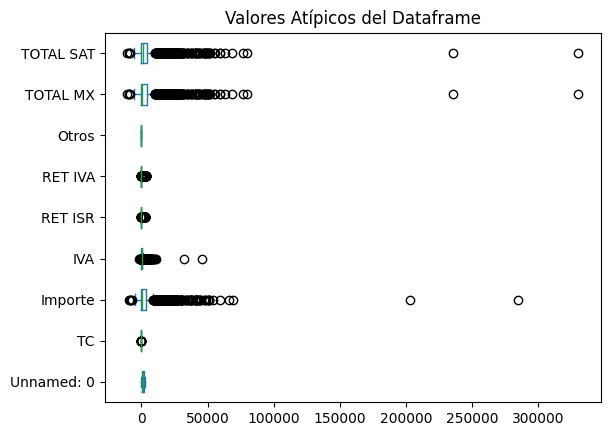

In [18]:
#diagrama de caja o bigote de cada columna del dataframe
fig = plt.figure(figsize =(15, 8))
data2.plot(kind='box', vert=False)
plt.title("Valores Atípicos del Dataframe")
plt.show() #dibujamos el diagrama

In [19]:
#SD. valores extremos
y=cuantitativas0
Limite_Superior= y.mean() + 3*y.std()
Limite_Inferior= y.mean() - 3*y.std()
print("Limite superior permitido", Limite_Superior)
print("Limite inferior permitido", Limite_Inferior)

Limite superior permitido TC              4.239688
IMPORTE     25167.992859
IVA          4563.165637
RET ISR       667.271992
RET IVA       958.239955
TOTAL MX    28488.002843
dtype: float64
Limite inferior permitido TC             -2.129870
IMPORTE    -18869.298785
IVA         -3523.520012
RET ISR      -627.750813
RET IVA      -839.215179
TOTAL MX   -21455.655297
dtype: float64


In [20]:
#oUTLIERS
outliers= cuantitativas0[(y>Limite_Superior)|(y<Limite_Inferior)]
outliers

,TC,IMPORTE,IVA,RET ISR,RET IVA,TOTAL MX
0,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,32068.97,5131.03,NaN,NaN,37200.00
7,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
#Outliers a nulos
cuantitativassi= cuantitativas0[(y<=Limite_Superior)&(y>=Limite_Inferior)]
cuantitativassi

,TC,IMPORTE,IVA,RET ISR,RET IVA,TOTAL MX
0,1.0,0.000000,2248.280000,0.00,0.00,2248.2800
1,1.0,490.000000,78.400000,0.00,0.00,568.4000
2,1.0,195.000000,31.200000,0.00,0.00,226.2000
3,1.0,10694.250000,1711.080000,0.00,0.00,12405.3300
4,1.0,0.000000,519.800000,0.00,0.00,0.0000
5,1.0,0.000000,519.800000,0.00,0.00,0.0000
6,1.0,NaN,NaN,0.00,0.00,NaN
7,1.0,8620.690000,1379.310000,0.00,0.00,10000.0000
8,1.0,0.010000,519.800000,0.00,0.00,0.0100
9,1.0,0.000000,519.800000,0.00,0.00,0.0000


In [22]:
#Check nulos
valores_nulos0=cuantitativas0.isnull().sum()
valores_nulos0

TC          0
IMPORTE     0
IVA         0
RET ISR     0
RET IVA     0
TOTAL MX    0
dtype: int64

In [23]:
#"Mean" para los nulos
#copy df
data_clean0=cuantitativas0.copy()
data_clean=data_clean0.fillna(round(data_clean0.mean(),1))
data_clean0

,TC,IMPORTE,IVA,RET ISR,RET IVA,TOTAL MX
0,1.0000,0.000000,2248.280000,0.00,0.00,2248.2800
1,1.0000,490.000000,78.400000,0.00,0.00,568.4000
2,1.0000,195.000000,31.200000,0.00,0.00,226.2000
3,1.0000,10694.250000,1711.080000,0.00,0.00,12405.3300
4,1.0000,0.000000,519.800000,0.00,0.00,0.0000
5,1.0000,0.000000,519.800000,0.00,0.00,0.0000
6,1.0000,32068.970000,5131.030000,0.00,0.00,37200.0000
7,1.0000,8620.690000,1379.310000,0.00,0.00,10000.0000
8,1.0000,0.010000,519.800000,0.00,0.00,0.0100
9,1.0000,0.000000,519.800000,0.00,0.00,0.0000


In [25]:
#CHECK nulos new df
valores_nulos=data_clean0.isnull().sum()
valores_nulos
# Union de la columna cuantitativa a lo cuantitativo
Datos_limpios = pd.concat([data_clean0, cualitativas0], axis=1)
Datos_limpios

,TC,IMPORTE,IVA,RET ISR,RET IVA,TOTAL MX,Unnamed: 0,FECHA,FOLIO,UUID,RFC,PROVEEDOR,TIPO GASTO,GASTO,TIPO,STATUS,POLIZA
0,1.0000,0.000000,2248.280000,0.00,0.00,2248.2800,0,1/1/2020,39408,BD20F436-72CC-4BE2-AD37-5999D71AA391,ARE080115PBA,ARSI RENTA SA DE CV,MAQUINARIA,SIN DEFINIR,I,Vigente,NaN
1,1.0000,490.000000,78.400000,0.00,0.00,568.4000,1,1/1/2020,1.0101E+18,85AEAC2E-6395-44A0-9CB9-754D06893375,BNM840515VB1,"BANCO NACIONAL DE MEXICO, S.A.",COMISION BANCARIA,SIN DEFINIR,I,Vigente,NaN
2,1.0000,195.000000,31.200000,0.00,0.00,226.2000,2,1/1/2020,1.0101E+18,BD0DFE85-D776-41CB-9C5C-4FA7923E687A,BNM840515VB1,"BANCO NACIONAL DE MEXICO, S.A.",COMISION BANCARIA,SIN DEFINIR,I,Vigente,NaN
3,1.0000,10694.250000,1711.080000,0.00,0.00,12405.3300,3,1/1/2020,3663,EF4504D6-830D-415C-AF03-80CF54C5E28E,PSS120625C86,PROMOTORA DE SERVICIOS Y SOLUCIONES EMPRESARIA...,HONORARIOS CONTABLES,SIN DEFINIR,I,Vigente,NaN
4,1.0000,0.000000,519.800000,0.00,0.00,0.0000,4,1/1/2020,2849,EC2F4AA4-BA64-4E2E-A5B7-4EBBE042D6D3,ENA7006081P0,ELECTROTERMICA NACIONAL SA DE CV,COMPRAS,SIN DEFINIR,P,Vigente,NaN
5,1.0000,0.000000,519.800000,0.00,0.00,0.0000,5,1/1/2020,2860,F76E5BAB-1185-472D-A4FB-2A71115DF60A,ENA7006081P0,ELECTROTERMICA NACIONAL SA DE CV,COMPRAS,SIN DEFINIR,P,Vigente,NaN
6,1.0000,32068.970000,5131.030000,0.00,0.00,37200.0000,6,1/1/2020,944,FCB00679-F8D9-4890-9E8B-C2F6B10EB88E,GIC9001301A6,GRUPO INDUSTRIAL CASILLAS SA DE CV,MAQUILAS GIC,SIN DEFINIR,I,Vigente,NaN
7,1.0000,8620.690000,1379.310000,0.00,0.00,10000.0000,7,1/1/2020,945,C0CA7FD7-66E9-4E76-BCAB-F359F1F8528D,GIC9001301A6,GRUPO INDUSTRIAL CASILLAS SA DE CV,MAQUILAS GIC,SIN DEFINIR,I,Vigente,PE07-ENE20
8,1.0000,0.010000,519.800000,0.00,0.00,0.0100,8,1/1/2020,2.20191E+13,3AF035FC-435F-DD4C-9663-6369E2DB8CA9,IFO9409288P6,"INTERCAM FONDOS, S.A. DE C.V. SOCIEDAD OPERADO...",COMISION BANCARIA,SIN DEFINIR,I,Vigente,NaN
9,1.0000,0.000000,519.800000,0.00,0.00,0.0000,9,1/1/2020,529,9CB543C7-1AE6-4F42-8CC5-28509B6B09A3,MECM7303141S8,MARISOL MENDOZA CHAVEZ,COMPRAS,SIN DEFINIR,P,Vigente,NaN


In [26]:

Datos_limpios.to_csv("gc20clean.csv")

gc21

In [27]:
data1.info()
cuantitativas1= data1.iloc[:,9:15]
cualitativas1= data1.iloc[:,[0,1,2,3,4,5,6,7,16,17,18]]
cuantitativas1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3035 entries, 0 to 3034
Data columns (total 19 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Unnamed: 0   3035 non-null   int64  
 1   FECHA        3035 non-null   object 
 2   FOLIO        2888 non-null   object 
 3   UUID         3035 non-null   object 
 4   RFC          3035 non-null   object 
 5   PROVEEDOR    3035 non-null   object 
 6   TIPO GASTO   3035 non-null   object 
 7   DESCRIPCION  3035 non-null   object 
 8   MP           2381 non-null   object 
 9   TC           3035 non-null   float64
 10  IMPORTE      3035 non-null   float64
 11  IVA          3035 non-null   float64
 12  RET ISR      3035 non-null   float64
 13  RET IVA      3035 non-null   float64
 14  TOTAL MX     3035 non-null   float64
 15  TOTAL SAT    3035 non-null   float64
 16  TIPO         3035 non-null   object 
 17  STATUS       3035 non-null   object 
 18  POLIZA       663 non-null    object 
dtypes: flo

In [28]:
#EV usando "Mean"
y=cuantitativas1
Limite_Superior= y.mean() + 3*y.std()
Limite_Inferior= y.mean() - 3*y.std()
print("Limite superior permitido", Limite_Superior)
print("Limite inferior permitido", Limite_Inferior)

Limite superior permitido TC              6.286851
IMPORTE     36154.569820
IVA          5464.876801
RET ISR       900.150092
RET IVA      1200.884906
TOTAL MX    40680.462408
dtype: float64
Limite inferior permitido TC             -3.981398
IMPORTE    -27625.812771
IVA         -4276.811367
RET ISR      -833.428945
RET IVA     -1053.848939
TOTAL MX   -31176.694132
dtype: float64


In [29]:
#Outliers
outliers= cuantitativas1[(y>Limite_Superior)|(y<Limite_Inferior)]
outliers

,TC,IMPORTE,IVA,RET ISR,RET IVA,TOTAL MX
0,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN


In [30]:
#Outliers a nulos
cuantitativassi= cuantitativas1[(y<=Limite_Superior)&(y>=Limite_Inferior)]
cuantitativassi

,TC,IMPORTE,IVA,RET ISR,RET IVA,TOTAL MX
0,1.0,490.000000,78.400000,0.00,0.00,568.400000
1,1.0,345.000000,55.200000,0.00,0.00,400.200000
2,1.0,3447.410000,551.590000,0.00,0.00,3999.000000
3,1.0,5551.380000,888.220000,0.00,0.00,6439.600000
4,1.0,5551.980000,888.320000,0.00,0.00,6440.300000
5,1.0,0.000000,0.000000,0.00,0.00,0.000000
6,1.0,0.000000,0.000000,0.00,0.00,0.000000
7,1.0,0.000000,0.000000,0.00,0.00,0.000000
8,1.0,0.000000,0.000000,0.00,0.00,0.000000
9,1.0,0.000000,0.000000,0.00,0.00,0.000000


In [31]:
#Check de nulos y remplazo con mean
valores_nulos1=cuantitativas1.isnull().sum()
valores_nulos1
#Copy df
data_clean1=cuantitativas1.copy()
data_clean=data_clean1.fillna(round(data_clean1.mean(),1))
data_clean1

,TC,IMPORTE,IVA,RET ISR,RET IVA,TOTAL MX
0,1.00000,490.000000,78.400000,0.00,0.00,568.400000
1,1.00000,345.000000,55.200000,0.00,0.00,400.200000
2,1.00000,3447.410000,551.590000,0.00,0.00,3999.000000
3,1.00000,5551.380000,888.220000,0.00,0.00,6439.600000
4,1.00000,5551.980000,888.320000,0.00,0.00,6440.300000
5,1.00000,0.000000,0.000000,0.00,0.00,0.000000
6,1.00000,0.000000,0.000000,0.00,0.00,0.000000
7,1.00000,0.000000,0.000000,0.00,0.00,0.000000
8,1.00000,0.000000,0.000000,0.00,0.00,0.000000
9,1.00000,0.000000,0.000000,0.00,0.00,0.000000


In [32]:
#CHECK DF CLEAN
valores_nulos=data_clean1.isnull().sum()
valores_nulos

TC          0
IMPORTE     0
IVA         0
RET ISR     0
RET IVA     0
TOTAL MX    0
dtype: int64

In [33]:
#JOIN QUANT & QUANT
Datos_limpios = pd.concat([data_clean1, cualitativas1], axis=1)
Datos_limpios

,TC,IMPORTE,IVA,RET ISR,RET IVA,TOTAL MX,Unnamed: 0,FECHA,FOLIO,UUID,RFC,PROVEEDOR,TIPO GASTO,DESCRIPCION,TIPO,STATUS,POLIZA
0,1.00000,490.000000,78.400000,0.00,0.00,568.400000,0,1/1/2021,1.0101E+18,71B4C8B9-8DAA-47CC-AD47-9DD90AA5AF6B,BNM840515VB1,"BANCO NACIONAL DE MEXICO, S.A.",COMISION BANCARIA,COMISION COBRADA,I,Vigente,0
1,1.00000,345.000000,55.200000,0.00,0.00,400.200000,1,1/1/2021,1.0101E+18,B8AEDE83-CC76-404C-A611-6B5A87BA561F,BNM840515VB1,"BANCO NACIONAL DE MEXICO, S.A.",COMISION BANCARIA,COMISION COBRADA,I,Vigente,0
2,1.00000,3447.410000,551.590000,0.00,0.00,3999.000000,2,1/1/2021,19788,19B9B2C2-DF58-E24D-B43A-3FC4D5A929E7,ESI9612311E7,"ELECTRONICOS Y SIMILARES, S.A. DE C.V.",COMPRAS,MOTO E7 PLUS AZUL 64GB 4RAM,I,Vigente,0
3,1.00000,5551.380000,888.220000,0.00,0.00,6439.600000,3,1/1/2021,211781,EAB26414-DD9A-4E8F-9F5C-05FE24D98E48,BLE1512082R9,BEPENSA LEASING S.A. DE C.V.,ARRENDAMIENTO FINANCIERO,AA RENTA EXIGIBLE CL0000006876 6/36 de 03/12/2...,I,Vigente,0
4,1.00000,5551.980000,888.320000,0.00,0.00,6440.300000,4,1/1/2021,211782,C16F79B5-FB35-4BFC-AF84-708B24F500BB,BLE1512082R9,BEPENSA LEASING S.A. DE C.V.,ARRENDAMIENTO FINANCIERO,AA RENTA EXIGIBLE CL0000006877 6/36 de 03/12/2...,I,Vigente,0
5,1.00000,0.000000,0.000000,0.00,0.00,0.000000,5,1/1/2021,4101,1BDD6B05-B42C-46D8-AF16-0D91FEDCE822,ENA7006081P0,ELECTROTERMICA NACIONAL SA DE CV,COMPRAS,Pago,P,Vigente,0
6,1.00000,0.000000,0.000000,0.00,0.00,0.000000,6,1/1/2021,32322,60B3F20E-5A5E-4439-83C6-2F8052F90D2A,AAE6411055P8,"AESA ARTICULOS ELECTRICOS, S.A. DE C.V.",COMPRAS,Pago,P,Vigente,0
7,1.00000,0.000000,0.000000,0.00,0.00,0.000000,7,1/1/2021,9231013,26928ED7-4CBE-4102-99A5-DE5CF2D92698,ANE140618P37,Servicios Comerciales Amazon México S. de R.L....,NO DEDUCIBLE,"Pagani, Coche de Control Remoto Escala 1:24, C...",I,Vigente,0
8,1.00000,0.000000,0.000000,0.00,0.00,0.000000,8,1/1/2021,9231022,E6883E6F-6947-41DC-AF28-7027615DF8B4,ANE140618P37,Servicios Comerciales Amazon México S. de R.L....,NO DEDUCIBLE,Strathmore Libreta para Aprender a Dibujar Ani...,I,Vigente,0
9,1.00000,0.000000,0.000000,0.00,0.00,0.000000,9,1/1/2021,9231026,A54AB33B-1D51-4213-8147-A001D3980B72,ANE140618P37,Servicios Comerciales Amazon México S. de R.L....,NO DEDUCIBLE,ENCORDADURA DADDARIO MOD. J-810 4/4M,I,Vigente,0


In [34]:

Datos_limpios.to_csv("gc21cleano.csv")

gc22

In [35]:
data2.info()
#cQUANT 
cuantitativas2= data2.iloc[:,9:15]
#QUAL 
cualitativas2= data2.iloc[:,[0,1,2,3,4,5,6,7,16,17,18]]
#SD. valores extremos
y=cuantitativas2
Limite_Superior= y.mean() + 3*y.std()
Limite_Inferior= y.mean() - 3*y.std()
print("Limite superior permitido", Limite_Superior)
print("Limite inferior permitido", Limite_Inferior)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2577 entries, 0 to 2576
Data columns (total 20 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Unnamed: 0   2577 non-null   int64  
 1   Fecha        2577 non-null   object 
 2   Folio        2475 non-null   object 
 3   UUID         2577 non-null   object 
 4   RFC          2577 non-null   object 
 5   Proveedor    2577 non-null   object 
 6   TIPO GASTO   2577 non-null   object 
 7   Descripción  2577 non-null   object 
 8   MP           2024 non-null   object 
 9   TC           1941 non-null   float64
 10  Importe      2577 non-null   float64
 11  IVA          2577 non-null   float64
 12  RET ISR      2577 non-null   float64
 13  RET IVA      2577 non-null   float64
 14  Otros        2577 non-null   int64  
 15  TOTAL MX     2577 non-null   float64
 16  TOTAL SAT    2577 non-null   float64
 17  Tipo         2577 non-null   object 
 18  Status       2577 non-null   object 
 19  Poliza

In [37]:
#Outliers
outliers= cuantitativas2[(y>Limite_Superior)|(y<Limite_Inferior)]
outliers
#Null check
valores_nulos2=cuantitativas2.isnull().sum()
valores_nulos2
#Mean pa quitar nulos y copy del df
data_clean2=cuantitativas2.copy()
data_clean=data_clean2.fillna(round(data_clean2.mean(),1))
data_clean2

,TC,Importe,IVA,RET ISR,RET IVA,Otros
0,1.0000,5551.38000,888.220000,0.00,0.00,0
1,1.0000,5551.98000,888.320000,0.00,0.00,0
2,1.0000,0.00000,0.000000,0.00,0.00,0
3,1.0000,0.00000,0.000000,0.00,0.00,0
4,1.0000,0.00000,0.000000,0.00,0.00,0
5,1.0000,0.00000,0.000000,0.00,0.00,0
6,1.0000,360.00000,57.600000,0.00,0.00,0
7,1.0000,0.00000,0.000000,0.00,0.00,0
8,1.0000,0.00000,0.000000,0.00,0.00,0
9,1.0000,78.00000,0.000000,0.00,0.00,0


In [39]:
#CHECK NULLS DF CLEAN
valores_nulos=data_clean2.isnull().sum()
valores_nulos
# QUANT&QUANT
Datos_limpios = pd.concat([data_clean2, cualitativas2], axis=1)
Datos_limpios
Datos_limpios.to_csv("gc22clean.csv")

gc23

In [43]:
data3.info()
#QUANT 
cuantitativas3= data3.iloc[:,9:14]
#QUAL
cualitativas3= data3.iloc[:,[0,1,2,3,4,5,6,7,15,16,17,18]]
#SD.  extremos
y=cuantitativas3
Limite_Superior= y.mean() + 3*y.std()
Limite_Inferior= y.mean() - 3*y.std()
print("Limite superior permitido", Limite_Superior)
print("Limite inferior permitido", Limite_Inferior)
#OUTLIERS
outliers= cuantitativas3[(y>Limite_Superior)|(y<Limite_Inferior)]
outliers
#CHECK NULL
valores_nulos3=cuantitativas3.isnull().sum()
valores_nulos3
#MEAN PA QUITAR NULOS
#CPOY DF CLEAN
data_clean3=cuantitativas3.copy()
data_clean=data_clean3.fillna(round(data_clean2.mean(),1))
data_clean3
#CHECK NULL CLEAN
valores_nulos=data_clean3.isnull().sum()
valores_nulos
# QUANT&QUANT
Datos_limpios = pd.concat([data_clean3, cualitativas3], axis=1)
Datos_limpios
Datos_limpios.to_csv("gc23clean.csv")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 397 entries, 0 to 396
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Unnamed: 0   397 non-null    int64  
 1   Fecha        397 non-null    object 
 2   Folio        384 non-null    object 
 3   UUID         397 non-null    object 
 4   RFC          397 non-null    object 
 5   Proveedor    397 non-null    object 
 6   TIPO GASTO   397 non-null    object 
 7   Descripción  397 non-null    object 
 8   MP           397 non-null    object 
 9   FP           397 non-null    int64  
 10  TC           397 non-null    float64
 11  Importe      397 non-null    float64
 12  IVA          397 non-null    float64
 13  RET ISR      397 non-null    float64
 14  RET IVA      397 non-null    float64
 15  Otros        397 non-null    int64  
 16  TOTAL MX     397 non-null    float64
 17  TOTAL SAT    397 non-null    float64
 18  Tipo         397 non-null    object 
 19  Status  